# Limestone Data Challenge 2024


My approach involves using the K-means clustering algorithm to analyze a dataset of players' behavior in the Prisoner's Dilemma. Here's a summary 

Data Preparation: You start with a feature extraction from the dataset. We defined 12 metrics to score the play strategy and we normalized it.

Data Clustering: We confronted it as a clustering problem. We used the k-means clustering approach using scikit-learn.
Finding Optimal Number of Clusters:

We used the silhouette score method, to compute silhouette scores for different numbers of clusters and select the number of clusters that maximizes the silhouette score.
Cluster Analysis:

After determining the optimal number of clusters, we applied the K-means algorithm with this number of clusters to the dataset.
You assign cluster labels to each data point (player) and analyze the resulting clusters.

In [5]:
import csv
import numpy as np
import math

# For clustering of stocks into sectors
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from scipy.spatial.distance import squareform

# For making neural net models of indices
import torch
from torch import nn
from torch import optim

# For data visualisation
import matplotlib.pyplot as plt

# For random initialization of the trading strategy vector
import random

# For making waiting fun :)
from tqdm import tqdm

In [6]:
def relu(x):
    return 1/(1+np.exp(-x))

In [7]:
#list of feautures that we have defined inside for the dataset
niceness=[]
retailiating=[]
forgiving=[]
non_envious=[]
cheating_sequence_length=[] 

for i in range(202):
    niceness.append(-1)
    retailiating.append(-1)
    forgiving.append(-1)
    non_envious.append(-1)
    cheating_sequence_length.append(-1)

def niceness_value(player_moves,opponent_moves):
    number_of_rounds=len(player_moves)
    number_of_trusts=0
    for i in range(len(player_moves)):
        if player_moves[i]=="TRUST":
            number_of_trusts+=1
    y=number_of_trusts/number_of_rounds
    return relu(y-0.5)

def retailiating_value(player_moves,opponent_moves):
    number_of_rounds=len(player_moves)
    number_of_trusts=0
    for i in range(len(player_moves)):
        if player_moves[i]=="CHEAT" and opponent_moves[i-1]=="CHEAT":
            number_of_trusts+=1
    y =  number_of_trusts/number_of_rounds
    return relu(y-0.5)
    

def forgiving_value(player_moves,opponent_moves):
    number_of_rounds=len(player_moves)
    number_of_betrayals=0
    for i in range(1,len(player_moves)):
        if player_moves[i]=="TRUST" and opponent_moves[i-1]=="CHEAT":
            number_of_betrayals+=1
    y = number_of_betrayals/number_of_rounds
    return relu(y-0.5)   

def non_envious_value(player_moves,opponent_moves):
    number_of_rounds=len(player_moves)
    number_of_betrayals=0
    for i in range(1,len(player_moves)):
        if player_moves[i]=="TRUST" and opponent_moves[i-1]=="TRUST":
            number_of_betrayals+=1
    y =  number_of_betrayals/number_of_rounds
    return relu(y-0.5)     

def retaliation_frequency(player_moves,opponent_moves):
    #return 0
    number_of_rounds=len(player_moves)
    lengths_of_cheating_sequences=[]
    for i in range(len(player_moves)):
        if player_moves[i]=="CHEAT" :
            length=1
            for j in range(i+1,len(player_moves)):
                if player_moves[j]=="CHEAT":
                    length+=1
                else:
                    break
            lengths_of_cheating_sequences.append(length)
    if len(lengths_of_cheating_sequences)==0:
        return 0
    else:
        return relu(max(lengths_of_cheating_sequences)/number_of_rounds)    

In [8]:
import random
#more list of feautures that we have defined inside for the dataset

grudge_holding1=[]
randomization_tendency1=[]
adaptive_strategy1=[]
pattern_recognition1=[]
long_term_planning1=[]
adversarial_detection1=[]
cooperation_initiation1=[]
risk_taking_behavior1=[]
for i in range(202):
    grudge_holding1.append(-1)
    randomization_tendency1.append(-1)
    adaptive_strategy1.append(-1)
    pattern_recognition1.append(-1)
    long_term_planning1.append(-1)
    adversarial_detection1.append(-1)
    cooperation_initiation1.append(-1)
    risk_taking_behavior1.append(-1)
def grudge_holding(player_moves, opponent_moves):
    consecutive_defects = 0
    max_consecutive_defects = 0
    for i in range(len(player_moves)):
        if player_moves[i] == "CHEAT" and opponent_moves[i] == "CHEAT":
            consecutive_defects += 1
            max_consecutive_defects = max(max_consecutive_defects, consecutive_defects)
        else:
            consecutive_defects = 0
    return max_consecutive_defects / len(player_moves)

def randomization_tendency(player_moves):
    random_count = sum(1 for move in player_moves if move == "RANDOM")
    return random_count / len(player_moves)

def adaptive_strategy(player_moves, opponent_moves):
    adaptive_count = 0
    for i in range(1, len(player_moves)):
        if player_moves[i] == opponent_moves[i - 1]:
            adaptive_count += 1
    return adaptive_count / len(player_moves)

def pattern_recognition(player_moves, pattern_length=3):
    patterns = set()
    for i in range(len(player_moves) - pattern_length + 1):
        pattern = tuple(player_moves[i:i + pattern_length])
        patterns.add(pattern)
    return len(patterns) / len(player_moves)

def long_term_planning(player_moves, opponent_moves):
    planning_count = 0
    for i in range(1, len(player_moves)):
        if player_moves[i - 1] == "TRUST" and opponent_moves[i - 1] == "TRUST" and player_moves[i] == "CHEAT":
            planning_count += 1
    return planning_count / len(player_moves)

def adversarial_detection(player_moves, opponent_moves):
    detection_count = 0
    for i in range(1, len(player_moves)):
        if player_moves[i] != opponent_moves[i] and player_moves[i - 1] == opponent_moves[i - 1]:
            detection_count += 1
    return detection_count / len(player_moves)

def cooperation_initiation(player_moves):
    cooperation_initiation_count = sum(1 for move in player_moves if move == "TRUST" and player_moves.index(move) == 0)
    return cooperation_initiation_count / len(player_moves)

def risk_taking_behavior(player_moves):
    risk_count = sum(1 for move in player_moves if move == "CHEAT")
    return risk_count / len(player_moves)

# Example: Add feature values to corresponding lists



In [9]:
#general function to apply all the features to the player
def apply_features(playername,playermoves,opponentmoves):
    if (niceness[playername]==-1):
        niceness[playername]=niceness_value(playermoves,opponentmoves)
        retailiating[playername]=retailiating_value(playermoves,opponentmoves)
        forgiving[playername]=forgiving_value(playermoves,opponentmoves)
        non_envious[playername]=non_envious_value(playermoves,opponentmoves)
        cheating_sequence_length[playername]=retaliation_frequency(playermoves,opponentmoves)
        grudge_holding1[playername]=grudge_holding(playermoves,opponentmoves)
        randomization_tendency1[playername]=randomization_tendency(playermoves)
        adaptive_strategy1[playername]=adaptive_strategy(playermoves,opponentmoves)
        pattern_recognition1[playername]=pattern_recognition(playermoves)
        long_term_planning1[playername]=long_term_planning(playermoves,opponentmoves)
        adversarial_detection1[playername]=adversarial_detection(playermoves,opponentmoves)
        cooperation_initiation1[playername]=cooperation_initiation(playermoves)
        risk_taking_behavior1[playername]=risk_taking_behavior(playermoves)
        
    else:
        alpha = 0.3  # adjust as needed

        niceness[playername] = alpha * niceness_value(playermoves, opponentmoves) + (1 - alpha) * niceness[playername]
        retailiating[playername] = alpha * retailiating_value(playermoves, opponentmoves) + (1 - alpha) * retailiating[playername]
        forgiving[playername] = alpha * forgiving_value(playermoves, opponentmoves) + (1 - alpha) * forgiving[playername]
        non_envious[playername] = alpha * non_envious_value(playermoves, opponentmoves) + (1 - alpha) * non_envious[playername]
        cheating_sequence_length[playername] = alpha * retaliation_frequency(playermoves, opponentmoves) + (1 - alpha) * cheating_sequence_length[playername]
        grudge_holding1[playername] = alpha * grudge_holding(playermoves, opponentmoves) + (1 - alpha) * grudge_holding1[playername]
        randomization_tendency1[playername] = alpha * randomization_tendency(playermoves) + (1 - alpha) * randomization_tendency1[playername]
        adaptive_strategy1[playername] = alpha * adaptive_strategy(playermoves, opponentmoves) + (1 - alpha) * adaptive_strategy1[playername]
        pattern_recognition1[playername] = alpha * pattern_recognition(playermoves) + (1 - alpha) * pattern_recognition1[playername]
        long_term_planning1[playername] = alpha * long_term_planning(playermoves, opponentmoves) + (1 - alpha) * long_term_planning1[playername]
        adversarial_detection1[playername] = alpha * adversarial_detection(playermoves, opponentmoves) + (1 - alpha) * adversarial_detection1[playername]
        cooperation_initiation1[playername] = alpha * cooperation_initiation(playermoves) + (1 - alpha) * cooperation_initiation1[playername]
        risk_taking_behavior1[playername] = alpha * risk_taking_behavior(playermoves) + (1 - alpha) * risk_taking_behavior1[playername]

In [10]:

#parsing the csv file and applying the features to the players

with open("input_game.csv", 'r') as csvfile:
    csvreader = csv.reader(csvfile)     
    next(csvreader)
    csvreader = list(csvreader)
    lastgame=-1
    lastplayer1=-1
    lastplayer2=-1
    playerstrategy=[]
    opponentstrategy=[] 
    for i in range(len(csvreader)):
        a=csvreader[i]
        a[0]=int(a[0]) #game number
        a[1]=int(a[1]) #player number
        a[2]=int(a[2]) #player number
        a[5]=int(a[5]) #round number 
        #print(i)
        if a[0]!=lastgame:
            if lastgame!=-1:
                apply_features(lastplayer1,playerstrategy,opponentstrategy)
                apply_features(lastplayer2,opponentstrategy,playerstrategy)
            lastgame=a[0]
            playerstrategy=[a[3]]
            opponentstrategy=[a[4]]  
            lastplayer1=a[1]
            lastplayer2=a[2]            
        else:
            playerstrategy.append(a[3])
            opponentstrategy.append(a[4])
            lastgame=a[0]          
            lastplayer1=a[1]
            lastplayer2=a[2]
    csvfile.close()


In [11]:
#creating a list of players with their features
players=[]
player_features=[0,0,0,0,0,0,0,0,0,0,0,0,0]
for i in range(201):
    players.append(player_features.copy())
for i in range(201):
    players[i][0]=niceness[i+1]
    players[i][1]=retailiating[i+1]
    players[i][2]=forgiving[i+1]
    players[i][3]=non_envious[i+1]
    players[i][4]=cheating_sequence_length[i+1]
    players[i][5]=grudge_holding1[i+1]
    players[i][6]=randomization_tendency1[i+1]
    players[i][7]=adaptive_strategy1[i+1]
    players[i][8]=pattern_recognition1[i+1]
    players[i][9]=long_term_planning1[i+1]
    players[i][10]=adversarial_detection1[i+1]
    players[i][11]=cooperation_initiation1[i+1]
    players[i][12]=risk_taking_behavior1[i+1]
    
print(players)

[[0.5523282523455868, 0.43629601331417767, 0.49676097412423115, 0.4324334655213856, 0.535064079343486, 0.08614717988159432, 0.0, 0.45307748361580924, 0.09064179730871816, 0.01180298287362037, 0.1182142777069482, 0.04834890410958902, 0.2875659599541486], [0.5260754594893248, 0.4710758391302471, 0.4040065590869478, 0.4950226364093655, 0.5385346234581884, 0.15551648855859693, 0.0, 0.8610445288308934, 0.10222827072044659, 0.011528539034161884, 0.1339803940156304, 0.6024446017333245, 0.39420396721785084], [0.5788871732431587, 0.4148952020110618, 0.40020475147458123, 0.5511349070583068, 0.4340793758970727, 0.015587836929403995, 0.0, 0.8614256774043274, 0.07779933285283663, 0.02090789185765474, 0.14614571860190567, 0.8204160906688347, 0.17940859111225768], [0.3861818545651476, 0.49850539116885606, 0.3815004235069429, 0.38216669770420364, 0.6380695829476108, 0.18222652181584972, 0.0, 0.5059104771937094, 0.06884483073367037, 0.014636896560098873, 0.13333459326409625, 0.0001744115239212144, 0.96

In [12]:
players=np.array(players)
players=players*100


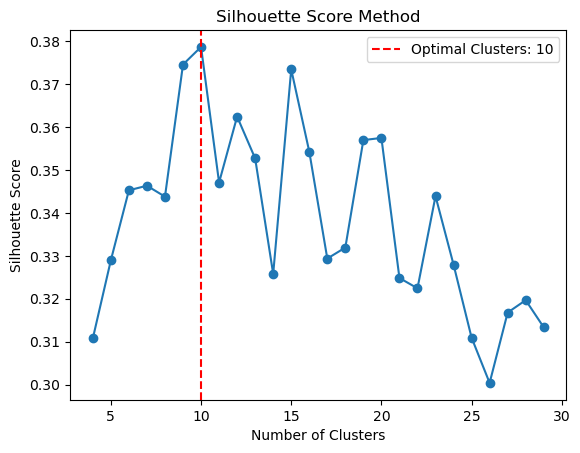

Optimal Number of Clusters: 10


In [13]:
#clustering the players into clusters
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

players = np.array(players)

silhouette_scores = []

k_range = range(4, 30)  

# Iterate through each number of clusters
for k in k_range:
    # Initialize and fit the k-means model
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(players)
    
    # Predict cluster labels
    labels = kmeans.labels_
    
    # Calculate silhouette score
    silhouette_avg = silhouette_score(players, labels)
    silhouette_scores.append(silhouette_avg)

# Find the index of the maximum silhouette score
optimal_clusters_idx = np.argmax(silhouette_scores)
optimal_clusters = k_range[optimal_clusters_idx]

# Plot silhouette scores
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.axvline(x=optimal_clusters, color='r', linestyle='--', label=f'Optimal Clusters: {optimal_clusters}')
plt.legend()
plt.show()

print("Optimal Number of Clusters:", optimal_clusters)

# Initialize and fit the k-means model with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters)
kmeans.fit(players)

# Predict cluster labels
labels = kmeans.labels_




In [14]:
from collections import defaultdict

# Group data points by their labels
clusters = defaultdict(list)
for i, label in enumerate(labels):
    clusters[label].append(i)

# Print each label and its data points
for label, data_points in clusters.items():
    print(f"Label: {label}")
    print(f"Data points: {data_points}")

Label: 1
Data points: [0, 6, 9, 18, 25, 35, 38, 40, 47, 48, 53, 65, 86, 89, 97, 101, 119, 122, 124, 133, 134, 142, 146, 150, 169, 182, 183]
Label: 5
Data points: [1, 29, 41, 66, 76, 78, 112, 137, 149, 158, 173, 178, 179]
Label: 0
Data points: [2, 19, 44, 68, 73, 85, 92, 99, 100, 102, 106, 117, 125, 148, 153, 160, 170, 175, 189, 198]
Label: 3
Data points: [3, 13, 14, 21, 22, 24, 32, 36, 37, 56, 63, 64, 83, 84, 95, 96, 104, 107, 109, 110, 114, 128, 135, 139, 140, 147, 154, 156, 157, 166, 171, 188, 196, 199]
Label: 9
Data points: [4, 10, 20, 26, 27, 28, 43, 58, 61, 74, 75, 90, 105, 108, 111, 116, 129, 131, 152, 161, 162, 163, 197]
Label: 2
Data points: [5, 7, 30, 33, 42, 57, 60, 72, 88, 98, 126, 132, 138, 141, 143, 151, 184, 185, 190, 194, 195]
Label: 6
Data points: [8, 12, 59, 94, 103, 120, 127, 136, 174, 177, 180, 191, 192, 193]
Label: 4
Data points: [11, 16, 34, 39, 45, 46, 50, 51, 52, 54, 55, 62, 69, 79, 81, 87, 91, 130, 145, 164, 167, 168, 176, 181, 187, 200]
Label: 7
Data points: [1

#### Solution to Problem Statement 1

The answer we got for first part is 11 different Stratergies are possible.

#### Solution to Problem Statement 2
The list of 11 sets of cluster are as follows:

In [17]:
Label: 6
Data_points: [0, 6, 18, 38, 124, 142, 182]
Label: 1
Data_points: [1, 29, 41, 66, 76, 78, 112, 137, 149, 158, 173, 178, 179]
Label: 10
Data_points: [2, 19, 68, 85, 92, 99, 100, 102, 117, 125, 148, 153, 160, 170, 175, 189, 198]
Label: 2
Data_points: [3, 13, 14, 21, 22, 24, 32, 37, 56, 63, 64, 83, 84, 95, 96, 104, 107, 109, 110, 114, 128, 135, 139, 140, 147, 154, 157, 166, 171, 188, 196, 199]
Label: 8
Data_points: [4, 9, 10, 20, 26, 27, 28, 40, 43, 47, 48, 53, 58, 65, 74, 75, 89, 97, 105, 108, 111, 116, 122, 129, 131, 134, 150, 152, 161, 162, 163, 197]
Label: 9
Data_points: [5, 7, 30, 33, 42, 57, 60, 88, 98, 126, 132, 138, 141, 143, 151, 185, 190, 195]
Label: 3
Data_points: [8, 12, 59, 72, 94, 103, 120, 127, 136, 174, 177, 180, 191, 192, 193]
Label: 4
Data_points: [11, 16, 34, 44, 45, 46, 51, 52, 55, 62, 69, 73, 79, 81, 106, 164, 168, 176, 181, 184, 187, 194, 200]
Label: 5
Data_points: [15, 17, 71, 77, 80, 93, 115, 121, 144, 159, 165]
Label: 0
Data_points: [23, 31, 49, 61, 67, 70, 82, 90, 113, 118, 123, 155, 172, 186]
Label: 7
Data_points: [25, 35, 36, 39, 50, 54, 86, 87, 91, 101, 119, 130, 133, 145, 146, 156, 167, 169, 183]

#### Solution to Problem Statement 4
A monte Carlo Simulation for the different Stratergies is as follows:

In [18]:
import csv
import numpy as np
from sklearn.cluster import KMeans

# Read data from CSV
games = []

with open("input_game.csv", 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    next(csvreader)  # Skip header
    for row in csvreader:
        games.append(row)

# Convert the list of games to a NumPy array
games_array = np.array(games)

# Extract player IDs and actions
player_ids = np.concatenate((games_array[:, 1].astype(int), games_array[:, 2].astype(int)))
player_actions = np.concatenate((games_array[:, 3], games_array[:, 4]))

# Encode player actions as numeric values
action_mapping = {'TRUST': 0, 'CHEAT': 1}
encoded_actions = np.array([action_mapping[action] for action in player_actions])

# Combine player IDs and encoded actions into feature matrix
feature_matrix = np.column_stack((player_ids, encoded_actions))

# Apply K-means clustering
num_clusters = 2  # Adjust this number as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(feature_matrix)
labels = kmeans.labels_

# Print cluster labels
print("Cluster labels for players:")
for player_id, label in zip(player_ids, labels):
    print(f"Player {player_id}: Cluster {label}")

Cluster labels for players:
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Player 174: Cluster 0
Play